In [1]:
## Mounting Drive
from google.colab import drive
import os

drive.mount('/content/drive', force_remount=True)
os.chdir("/content/drive/MyDrive/Great Learning/Projects")

import pandas as pd
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")
# pd.set_option('display.max_rows', None)

import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Enabled memory growth for TensorFlow.")
    except RuntimeError as e:
        print(e)

Mounted at /content/drive
Enabled memory growth for TensorFlow.


# Importing Libraries

# Part A

##**Build a Face Detection System**


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.config.run_functions_eagerly(True)
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.layers import ReLU, Concatenate
from keras.models import Model, load_model
from keras.optimizers import Adam



from tensorflow.python.keras import losses
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, precision_recall_curve, auc
import matplotlib.pyplot as plt


import cv2
from google.colab.patches import cv2_imshow

In [3]:
data = np.load('Data/Images.npy', allow_pickle=True)

In [4]:
data.shape

(393, 2)

In [5]:
data[0]

array([array([[[42, 37, 34],
               [56, 51, 48],
               [71, 66, 63],
               ...,
               [23, 33, 34],
               [26, 36, 37],
               [28, 38, 39]],

              [[40, 35, 32],
               [51, 46, 43],
               [64, 59, 56],
               ...,
               [27, 36, 35],
               [24, 33, 32],
               [26, 35, 34]],

              [[43, 38, 35],
               [51, 46, 43],
               [61, 56, 53],
               ...,
               [28, 30, 27],
               [33, 35, 32],
               [35, 37, 34]],

              ...,

              [[56, 47, 40],
               [57, 48, 41],
               [61, 52, 45],
               ...,
               [67, 48, 42],
               [55, 35, 28],
               [60, 40, 33]],

              [[53, 44, 37],
               [54, 45, 38],
               [57, 48, 41],
               ...,
               [59, 40, 34],
               [60, 40, 33],
               [54, 34, 27]],



In [6]:
images = [entry[0] for entry in data]
annotations = [entry[1] for entry in data]

In [7]:
IMG_SIZE = (640, 640)
resized_images = [cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), IMG_SIZE) for img in images]

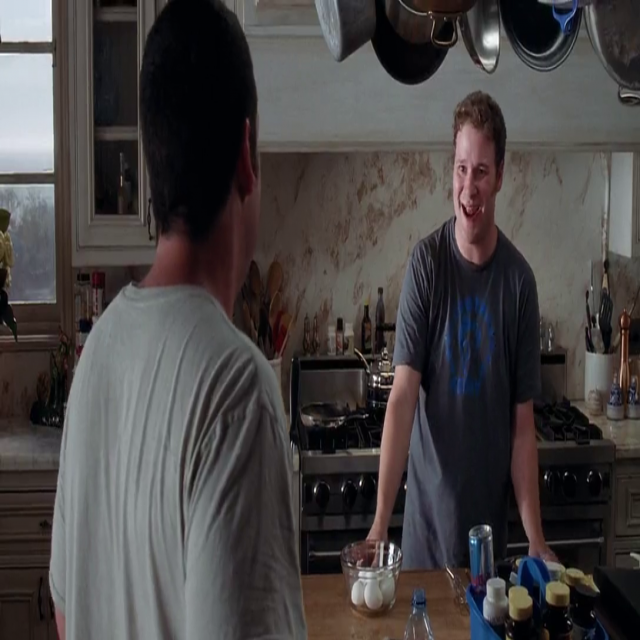

(None,
 [{'label': ['Face'],
   'notes': '',
   'points': [{'x': 0.7053087757313109, 'y': 0.23260437375745527},
    {'x': 0.7692307692307693, 'y': 0.36182902584493043}],
   'imageWidth': 1280,
   'imageHeight': 697}])

In [8]:
cv2_imshow(resized_images[1]), annotations[1]

## Resize the images and masks to the same shape and visualize the original and masked images

In [9]:
resized_annotations = []
for image, annotation_list in data:
    original_h, original_w = image.shape[:2]

    # Scale annotations accordingly
    new_annots = []
    for ann in annotation_list:
        new_ann = ann.copy()
        points = ann['points']
        x1 = int(points[0]['x'] * IMG_SIZE[0])
        y1 = int(points[0]['y'] * IMG_SIZE[1])
        x2 = int(points[1]['x'] * IMG_SIZE[0])
        y2 = int(points[1]['y'] * IMG_SIZE[1])
        new_ann['bbox'] = [x1, y1, x2, y2]
        new_annots.append(new_ann)

    resized_annotations.append(new_annots)

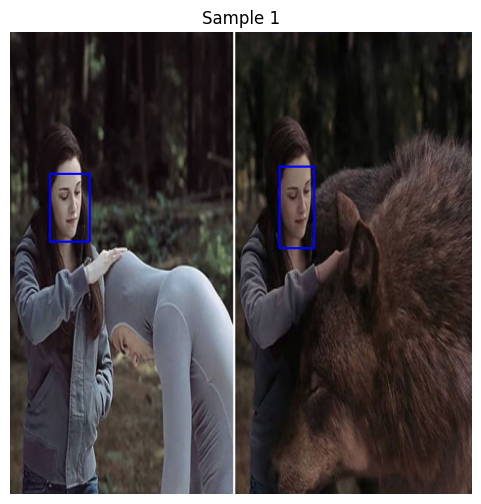

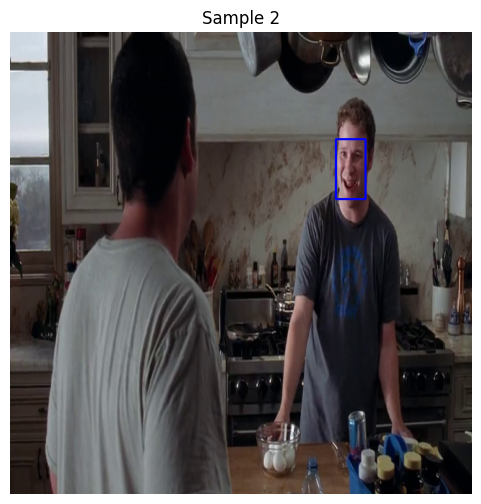

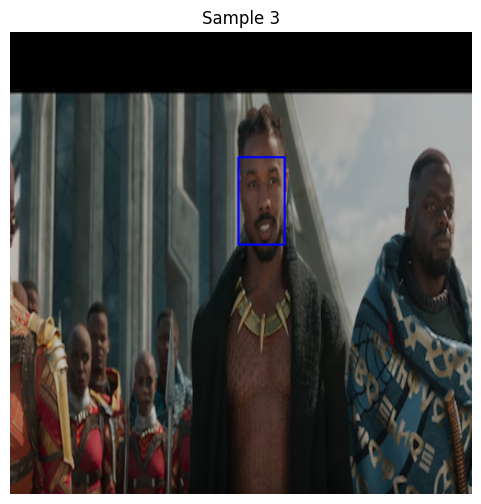

In [10]:
for i in range(3):
    img = resized_images[i].copy()
    anns = resized_annotations[i]

    for ann in anns:
        x1, y1, x2, y2 = ann['bbox']
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Sample {i+1}")
    plt.axis('off')
    plt.show()

## Split the data into train and test

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(resized_images, resized_annotations, test_size=0.2, random_state=42)

## Creating Face Detection Model

In [12]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [13]:
import torch
from pathlib import Path
from PIL import Image

# Load the YOLO model from PyTorch Hub (pretrained model)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # 'yolov5s' is the small model, you can use 'yolov5m', 'yolov5l', or 'yolov5x' for larger models

# Set the model to evaluation mode
model.eval()

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-4 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

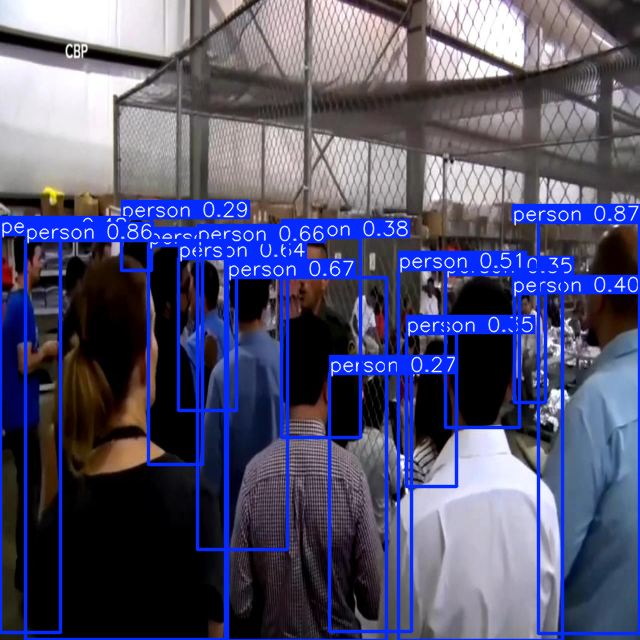

[       xcenter     ycenter       width      height  confidence  class    name
0   589.086426  428.019379  100.763550  410.844421    0.869431      0  person
1   125.597649  440.013855  199.402603  398.095703    0.855970      0  person
2   306.642731  458.692230  158.865967  362.615540    0.669668      0  person
3   242.754852  395.783203   90.456131  307.156525    0.658498      0  person
4   207.384384  334.792175   58.693695  151.622986    0.642779      0  person
5   175.584473  354.853088   53.718567  218.639420    0.548131      0  person
6   480.656158  454.652008  163.975037  370.695984    0.506614      0  person
7    30.161263  433.153046   60.322525  397.920959    0.480455      0  person
8   530.340454  348.077026   31.260986  108.302551    0.395322      0  person
9   320.822205  337.567566   78.679016  200.459839    0.377593      0  person
10  482.766968  351.189911   73.731293  153.489624    0.352890      0  person
11  431.894775  409.942139   49.873535  153.256104    0.350972 

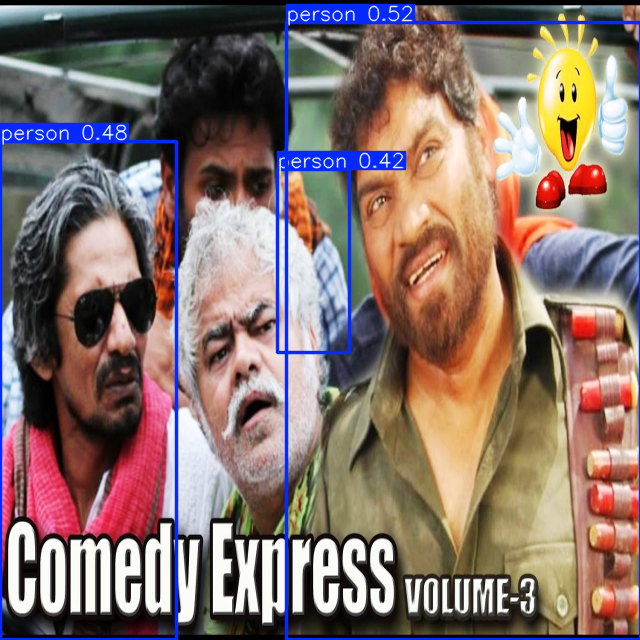

[      xcenter     ycenter       width      height  confidence  class    name
0  463.375061  330.584625  353.249878  616.922791    0.516497      0  person
1   88.426193  390.728333  176.852386  498.185150    0.483408      0  person
2  313.800659  260.867188   72.091431  182.905884    0.416795      0  person]


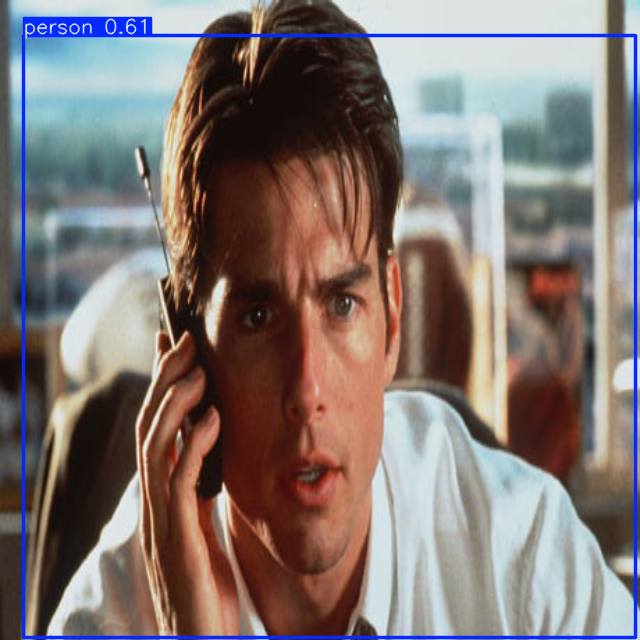

[      xcenter     ycenter       width      height  confidence  class    name
0  329.819702  336.565186  611.889893  601.867432    0.607005      0  person]


In [14]:
# Predict on test images
for i, img in enumerate(X_test[:3]):  # Show first 3 test images
    pil_img = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert OpenCV image to PIL
    results = model(pil_img)  # Run inference

    # Visualize results
    results.show()  # This will show the image with bounding boxes
    print(results.pandas().xywh)  # This will print the predicted bounding boxes in (x_center, y_center, width, height) format

** Since Yolo can identify the person's back as a face. We have to train the yolo model on a custom dataset**

In [15]:
import os

def convert_to_yolo_format(annotations, image_shape, class_id=0):
    h, w = image_shape[:2]
    yolo_boxes = []
    for ann in annotations:
        x1, y1, x2, y2 = ann['bbox']
        x_center = ((x1 + x2) / 2) / w
        y_center = ((y1 + y2) / 2) / h
        width = (x2 - x1) / w
        height = (y2 - y1) / h
        yolo_boxes.append(f"{class_id} {x_center} {y_center} {width} {height}")
    return yolo_boxes

# Save YOLO annotation text files
def save_yolo_labels(images, annotations, split):
    os.makedirs(f'dataset/images/{split}', exist_ok=True)
    os.makedirs(f'dataset/labels/{split}', exist_ok=True)

    for i, (img, annots) in enumerate(zip(images, annotations)):
        filename = f"{split}_{i}.jpg"
        labelname = filename.replace(".jpg", ".txt")

        # Save image
        img_path = f'dataset/images/{split}/{filename}'
        cv2.imwrite(img_path, cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

        # Save annotation
        labels = convert_to_yolo_format(annots, img.shape)
        with open(f'dataset/labels/{split}/{labelname}', 'w') as f:
            f.write("\n".join(labels))

save_yolo_labels(X_train, y_train, "train")
save_yolo_labels(X_test, y_test, "val")


In [16]:
data_yaml = """
train: ../dataset/images/train
val: ../dataset/images/val

nc: 1
names: ['Face']
"""

with open("dataset.yaml", "w") as f:
    f.write(data_yaml)

In [17]:
!python yolov5/train.py \
  --img 640 \
  --batch 16 \
  --epochs 15 \
  --data dataset.yaml \
  --weights yolov5s.pt \
  --name face_yolo_custom \
  --cache


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-05-04 05:51:23.488148: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746337883.520290    5183 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746337883.529999    5183 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=dataset.yaml, hyp=yolov5/data/hyps/hyp.s

In [18]:
import pandas as pd

pd.set_option('display.max_columns', None)
# Load the training results
results_df = pd.read_csv('yolov5/runs/train/face_yolo_custom/results.csv')
results_df

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.112140,0.042220,0,0.004262,0.45701,0.004047,0.000906,0.090411,0.030759,0,0.082900,0.001900,0.001900
1,1,0.088548,0.046902,0,0.172540,0.25339,0.113060,0.025170,0.076879,0.030579,0,0.064643,0.003643,0.003643
2,2,0.075210,0.043084,0,0.251160,0.31674,0.175540,0.049309,0.074748,0.034053,0,0.046121,0.005121,0.005121
3,3,0.069439,0.037798,0,0.243080,0.47371,0.209750,0.063721,0.067517,0.024343,0,0.027336,0.006336,0.006336
4,4,0.067590,0.034041,0,0.414410,0.58371,0.456310,0.135500,0.064333,0.021548,0,0.008286,0.007286,0.007286
5,5,0.062232,0.033888,0,0.332970,0.60633,0.344710,0.099058,0.062427,0.022262,0,0.006700,0.006700,0.006700
6,6,0.061015,0.034348,0,0.381510,0.62896,0.371190,0.134980,0.058353,0.022405,0,0.006700,0.006700,0.006700
7,7,0.056507,0.034523,0,0.555770,0.69683,0.554670,0.157930,0.055229,0.020864,0,0.006040,0.006040,0.006040
8,8,0.053409,0.029680,0,0.520570,0.70588,0.516340,0.195860,0.052439,0.019937,0,0.005380,0.005380,0.005380
9,9,0.051533,0.030861,0,0.663630,0.75881,0.665410,0.220950,0.047463,0.019391,0,0.004720,0.004720,0.004720


In [19]:
!python yolov5/val.py \
  --weights yolov5/runs/train/face_yolo_custom/weights/best.pt \
  --data dataset.yaml \
  --task val \
  --img 640

val: data=dataset.yaml, weights=['yolov5/runs/train/face_yolo_custom/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
fatal: cannot change to '/content/drive/MyDrive/Great': No such file or directory
YOLOv5 🚀 2025-5-4 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/MyDrive/Great Learning/Projects/dataset/labels/val.cache... 79 images, 0 backgrounds, 0 corrupt: 100% 79/79 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:03<00:00,  1.29s/it]
                   all         79        221       0.61        0.8      0.687      0.264
S

## Evaluation of the custom model by checking the validation batch

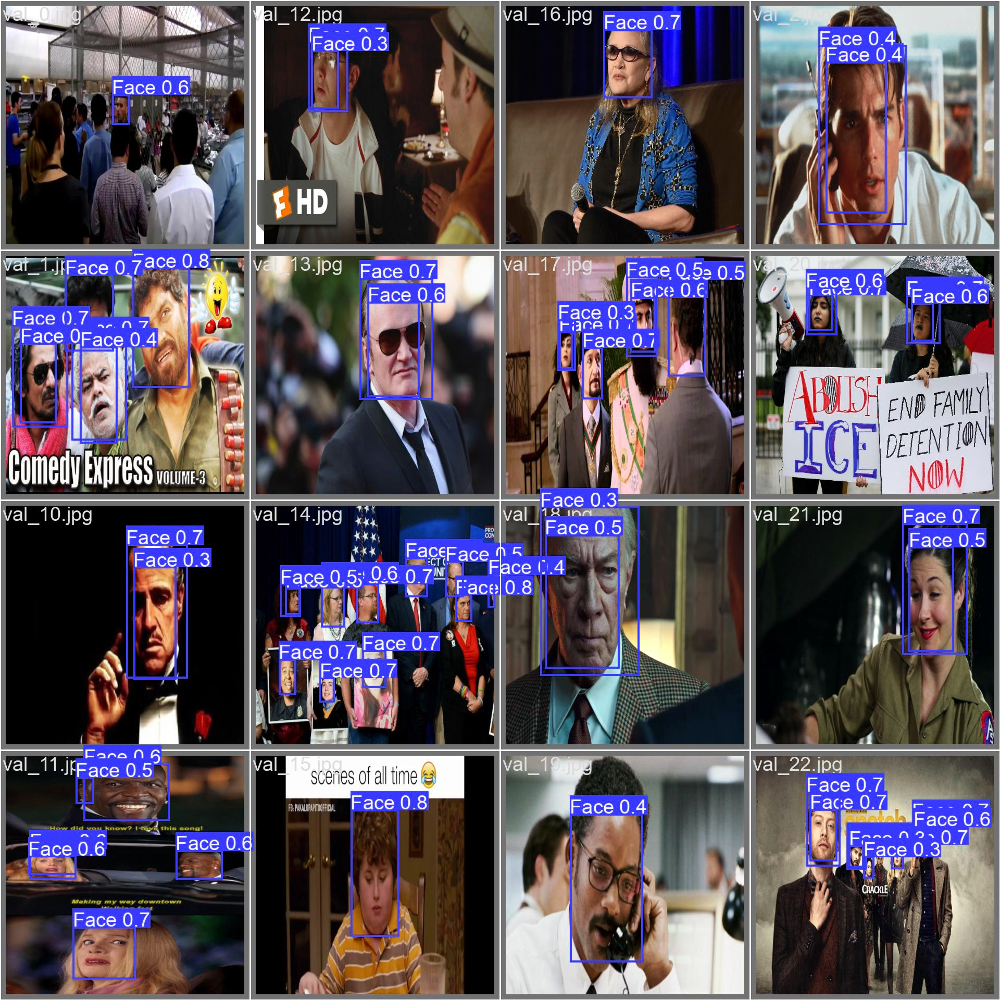

In [20]:
val_batch0 = plt.imread("yolov5/runs/val/exp/val_batch0_pred.jpg")
cv2_imshow(val_batch0)

## Visualizing Images

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-4 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


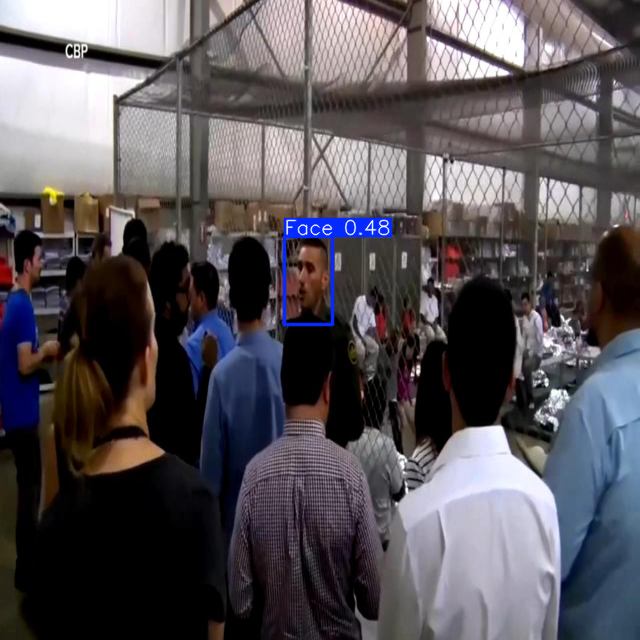

        xmin        ymin        xmax        ymax  confidence  class  name
0  284.07962  236.526581  332.579193  324.776703    0.483817      0  Face


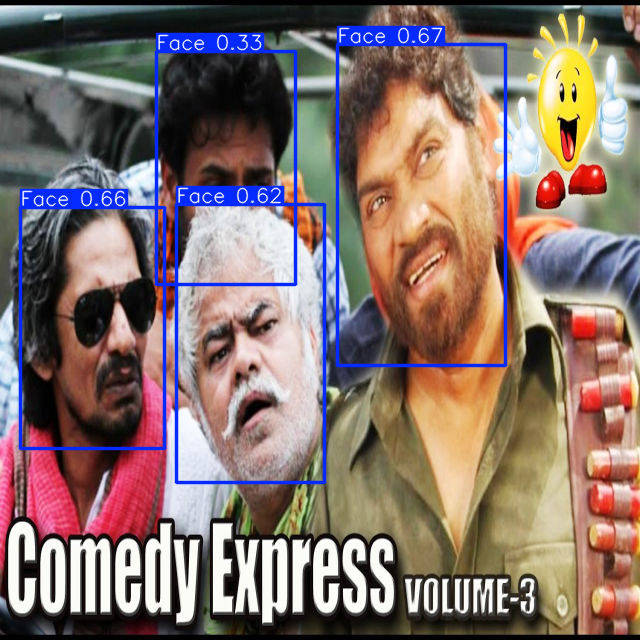

         xmin        ymin        xmax        ymax  confidence  class  name
0  337.610992   44.316162  505.667572  365.743988    0.671684      0  Face
1   20.493668  207.873779  164.677200  448.534363    0.659704      0  Face
2  176.196899  204.163971  324.054993  482.877228    0.618259      0  Face
3  156.237793   51.502686  295.741730  284.617279    0.329226      0  Face


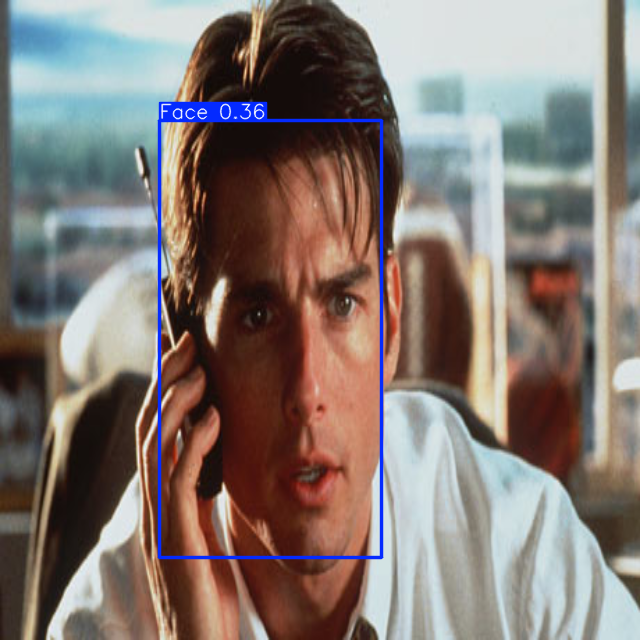

         xmin        ymin        xmax        ymax  confidence  class  name
0  159.687347  120.358994  381.805695  557.123047    0.363823      0  Face


In [21]:
# Load your trained model (replace 'exp2' if your run name is different)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='yolov5/runs/train/face_yolo_custom/weights/best.pt')
model.eval()

# Inference and display
for i in range(3):  # adjust as needed
    img = X_test[i]
    pil_img = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    results = model(pil_img)
    results.show()  # will open image with predicted boxes
    print(results.pandas().xyxy[0])  # display prediction dataframe (bounding box coordinates, confidence, class)

## Import images from folder ‘training_images’

In [22]:
!unzip "Data/training_images-20211126T092819Z-001.zip"

Archive:  Data/training_images-20211126T092819Z-001.zip
  inflating: training_images/real_00947.jpg  
  inflating: training_images/real_01052.jpg  
  inflating: training_images/real_01042.jpg  
  inflating: training_images/real_00964.jpg  
  inflating: training_images/real_01053.jpg  
  inflating: training_images/real_00971.jpg  
  inflating: training_images/real_01057.jpg  
  inflating: training_images/real_01044.jpg  
  inflating: training_images/real_01041.jpg  
  inflating: training_images/real_01067.jpg  
  inflating: training_images/real_00969.jpg  
  inflating: training_images/real_00956.jpg  
  inflating: training_images/real_00975.jpg  
  inflating: training_images/real_01021.jpg  
  inflating: training_images/real_00945.jpg  
  inflating: training_images/real_01068.jpg  
  inflating: training_images/real_01062.jpg  
  inflating: training_images/real_01016.jpg  
  inflating: training_images/real_01065.jpg  
  inflating: training_images/real_01027.jpg  
  inflating: training_im

In [23]:
os.listdir("training_images")[:5]

['real_00947.jpg',
 'real_01052.jpg',
 'real_01042.jpg',
 'real_00964.jpg',
 'real_01053.jpg']

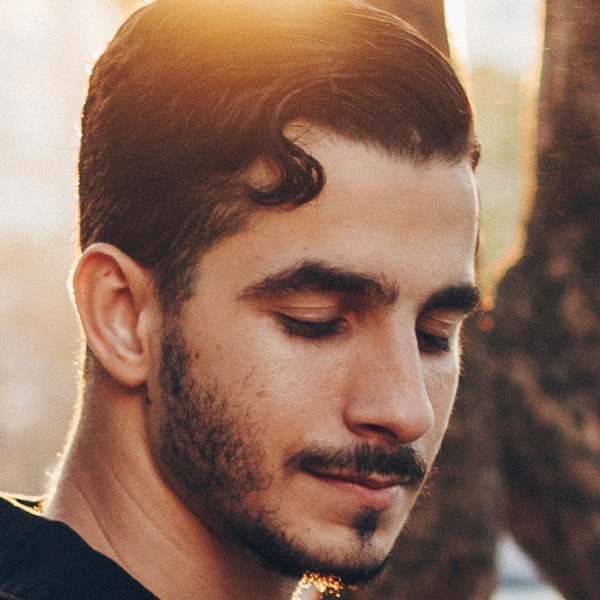

In [29]:
img2 = plt.imread("training_images/real_00730.jpg", cv2.IMREAD_COLOR)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
cv2_imshow(img2)

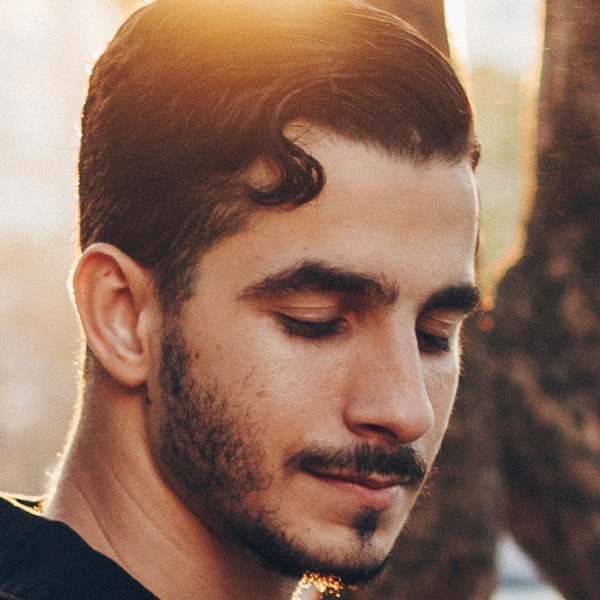

In [30]:
pil_img = Image.fromarray(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

results = model(pil_img)
results.show()

In [26]:
training_images = [plt.imread(f"training_images/{img}") for img in os.listdir("training_images")]

In [27]:
# Initialize list to store metadata
metadata = []

# Loop over images in the training_images list
for img, image_name in zip(training_images, os.listdir("training_images")):
    # Run inference on the image
    results = model(img)  # Perform inference
    predictions = results.pandas().xyxy[0]  # Extract predicted boxes as a DataFrame

    # Extract metadata for each detected face
    for index, row in predictions.iterrows():
        # Check if the detected object is a face (ensure class index corresponds to 'Face')
        if row['name'] == 'Face':  # assuming 'Face' is the class label in YOLO model
            # Extract metadata: image name, bounding box coordinates, confidence score
            metadata.append({
                'image_name': image_name,
                'x1': row['xmin'],
                'y1': row['ymin'],
                'x2': row['xmax'],
                'y2': row['ymax'],
                'confidence': row['confidence']
            })

# Create DataFrame from metadata
df = pd.DataFrame(metadata)

# Save to CSV
df.to_csv('face_mask_metadata.csv', index=False)

# Display a message confirming the process is complete
print(f'Metadata for faces and masks saved to face_mask_metadata.csv')

Metadata for faces and masks saved to face_mask_metadata.csv


In [28]:
df.head()

,image_name,x1,y1,x2,y2,confidence
0,real_00975.jpg,178.102356,47.809235,455.259308,530.573181,0.299585
1,real_00977.jpg,129.243805,43.238350,448.084747,578.379456,0.258611
2,real_01008.jpg,185.757156,142.966370,406.315002,554.893433,0.300714
3,real_01037.jpg,157.318893,179.351212,420.498138,508.723724,0.401519
4,real_00944.jpg,482.984467,276.090485,582.614807,432.137268,0.282532


YOLO Model doesn't have the capability to detect faces. Hence we have trained a YOLO model to correctly identify the Face from the screenshots